In [1]:
!nvidia-smi

Thu Dec 11 07:37:28 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 2080 Ti     Off |   00000000:B2:00.0 Off |                  N/A |
| 25%   36C    P8             17W /  250W |    5002MiB /  11264MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
import os
# NOTE!
# this is for a multi-gpu setup. we basically set which GPU is visible for the program.
# if you only have one GPU (most likely the case ;) ), make sure this is set to "0"!
# or remove this line completely!
# otherwise you may accidentally make your GPU "invisible" to the program!
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

# Latent Autoregressive Prior

In [3]:
import os
os.chdir("/home/exgr5/LGM/Assignments")
print(os.getcwd())

/home/exgr5/LGM/Assignments


In [4]:
import numpy as np
import torch
from matplotlib import pyplot as plt
from torch import nn
from torch.utils.data import DataLoader, StackDataset
from torchvision.transforms.v2 import Resize
from torchvision.transforms.v2.functional import horizontal_flip

from lgm.common import count_parameters, plot_learning_curves, EMA, Checkpointer
from lgm.data import get_datasets_and_loaders
from lgm.evaluation import fid, get_resnet, precision_recall
from lgm.gan import Discriminator, SDLayer
from lgm.layers import hidden_linear, CNNBody, Reshape, ConvBlockPrenorm
from lgm.larp import PositionalEncoding, ARTransformer, LARP, LARPTrainer
from lgm.vqgan import VQVAE, VectorQuantizer

torch.set_float32_matmul_precision('high')
torch.backends.cudnn.benchmark = True

## Data

We use Flickr as a running example here. You can of course change it as usual. If you use a smaller dataset like CIFAR, be sure to remove the `Resize` transform! Note also the `no_flip` argument -- normally the training data gets randomly flipped horizontally, but we don't want this. We want the data to be "reliable" so we can encode it with the VQVAE. We will explicitly flip the entire dataset, and encode that too, later down the line.

Shape/dtype of batch X [N, C, H, W]: torch.Size([128, 3, 64, 64]), torch.float32
Shape/dtype of batch y: torch.Size([128]), torch.int64


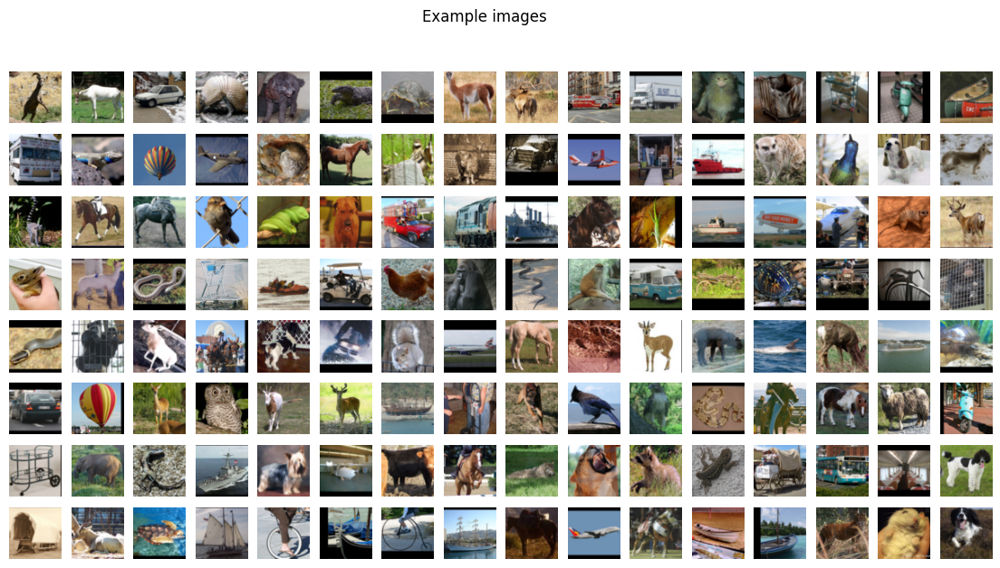

In [5]:
data = "stl10"
batch_size = 128

train_data, test_data, train_dataloader, test_dataloader = get_datasets_and_loaders(data, batch_size, num_workers=16,
                                                                                    no_flip=True,
                                                                                    additional_transforms=[Resize(64)])

## VQ Preparation

We load the VQVAE model and encode the entire dataset. Take note that we directly set it to `eval()` mode after creating the model. `nn.Module` is by default created in `training` mode. This would be very bad, as this would keep updating the codebook as well as batchnorm parameters. But we want to the VQVAE to be frozen.

Note that we have to re-create the actual architecture. There is a feature in torch to export entire models including call functions etc., but this is somewhat experimental and has some limitations that would make it awkward to use with our code base. So we propose to "just deal with it" and build the model manually, thenload the weights.

This means you have to build the exact architecture you used to train your VQVAE! If you want to use your own one, you will have to check back what that was. If you use one of our checkpoints, the parameters are:
- Flickr: As given here. `level_filters = [48, 96, 192, 384]`, `codebook_size = 256`.
- CIFAR10: `level_filters = [64, 128, 256]`, `codebook_size = 256`.
- STL-10: `level_filters = [48, 96, 192, 384]`, `codebook_size = 512`.
- FashionMNIST: `level_filters = [48, 96, 192]`, `codebook_size = 128`.

Everything else is the same for all checkpoints, e.g. `blocks_per_level = 2`, stride of 2 for all levels except the first, `code_dim = 48`, `activation = Mish`...

In [6]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using {device} device\n")

level_filters = [48, 96, 192, 384]
level_strides = [1] +  [2] * (len(level_filters) - 1)
blocks_per_level = 2
kernel_size = 3
activation = nn.Mish
n_levels = len(level_filters)

code_dim = 48

input_shape = next(iter(train_dataloader))[0].shape[1:]
input_pixels = input_shape[1]
final_pixels = int(input_pixels // np.prod(level_strides))

input_channels = input_shape[0]
final_filters = level_filters[-1] 

block_fn = ConvBlockPrenorm
block_kwargs = {"n_layers": 2, "activation": activation, "kernel_size": kernel_size,
                "use_se": True, "se_reduction_factor": 8, "se_bias": 1.,
                "use_residual": True, "bottleneck_factor": 1}

encoder = nn.Sequential()
encoder.append(nn.Conv2d(input_channels, level_filters[0], kernel_size, padding="same"))
encoder.append(CNNBody(blocks_per_level, level_filters, level_strides,
                       input_channels=level_filters[0],
                       direction="down", block_fn=block_fn, **block_kwargs))

encoder.append(nn.Conv2d(final_filters, code_dim, 1))


decoder = nn.Sequential()
decoder.append(nn.Conv2d(code_dim, final_filters, 1))
decoder.append(CNNBody(blocks_per_level, list(reversed(level_filters)), list(reversed(level_strides)),
                       input_channels=final_filters,
                       direction="up", block_fn=block_fn, **block_kwargs))
decoder.append(nn.Conv2d(level_filters[0], input_channels, 1))


codebook_size = 512
average = batch_size*final_pixels**2 / codebook_size
quantizer = VectorQuantizer(code_dim, codebook_size, 0.99, reset_frequency=len(train_dataloader), reset_threshold=1/50 * average)

likelihood = "laplace"  # corresponds to absolute error
vqvae = VQVAE(encoder, decoder, quantizer, likelihood)

vqvae = vqvae.to(device).eval()
with torch.no_grad():
    dummy = next(iter(train_dataloader))[0].to(device)
    test_output = vqvae(dummy, map_to_expected=True)

print("test output shape")
print(test_output.shape, "\n")
if test_output.shape[1] != input_channels:
    raise ValueError(f"WARNING! Expected {input_channels} output channels but got {test_output.shape[1]}")
if test_output.shape[2] != input_pixels:
    raise ValueError(f"WARNING! Expected {input_pixels} output pixels but got {test_output.shape[2]}")

print(vqvae)

Using cuda device

test output shape
torch.Size([128, 3, 64, 64]) 

VQVAE(
  (encoder): Sequential(
    (0): Conv2d(3, 48, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (1): CNNBody(
      (levels): ModuleList(
        (0): CNNLevel(
          (blocks): ModuleList(
            (0-1): 2 x ConvBlockPrenorm(
              (first_norm): BNWrap2d(48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
              (layers): Sequential(
                (0): Mish()
                (1): Conv2d(48, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
                (2): BNWrap2d(48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
                (3): Mish()
                (4): Conv2d(48, 48, kernel_size=(3, 3), stride=(1, 1), padding=same, bias=False)
              )
              (squeeze_excite): SqueezeExcite(
                (mapper): Sequential(
                  (0): Linear(in_features=48, out_features=6, bias=True)
                  (1)

In [7]:
quantizer.init_k_means(encoder(dummy))  # probably unnecessary

Initializing codebook with K-Means!


This loads the weights. Make sure to adapt the path. If you get an error about mismatching numbers, your architecture is likely incorrect.

In [8]:
vqvae.load_state_dict(torch.load("/home/exgr5/LGM/Assignments/vqvae_weights/vqvae_stl_8x8_cb512.pt"))

<All keys matched successfully>

Now we encode and quantize the data. We use `StackDataset` to create "dummy labels" since our training interface expects labels. They are just discarded anyway.

Note that the resulting dataset is very small. It would be possible to move it to the GPU completely. But there seem to be compatibility issues with multiprocessing in the data loader. So we just leave it in CPU memory and use our standard data loader code.

To have some data augmentation, we would like to horizontally flip the data. But if we just kept the typical random flipping from the loaded data at the start of the notebook, we would only be encoding one copy of each data point here! This means we would have either the original or the flipped version encoded, but not both. You might think, why don't we just flip the encoded images randomly? But this is not valid: Flipping the image and then encoding is _not_ the same as encoding and then flipping. Convolution is not equivariant to flipping! This is why we explicitly encode a flipped version of the training data. Then we concatenate the original and flipped data to have a doubled training dataset.

**Make sure to not use flipped data for FashionMNIST** as that is not typically a transformation we would like to do (will flip all the shoes, writings on shirts etc.).

In [9]:
test_encoded = []
with torch.inference_mode():
    for bb, _ in test_dataloader:
        test_encoded.append(vqvae.enquantize(bb.to(device)).to("cpu"))
test_encoded = torch.cat(test_encoded, dim=0)

train_encoded = []
with torch.inference_mode():
    for bb, _ in train_dataloader:
        train_encoded.append(vqvae.enquantize(bb.to(device)).to("cpu"))
train_encoded = torch.cat(train_encoded, dim=0)

In [10]:
train_encoded_flipped = []
with torch.inference_mode():
    for bb, _ in train_dataloader:
        train_encoded_flipped.append(vqvae.enquantize(horizontal_flip(bb).to(device)).to("cpu"))
train_encoded_flipped = torch.cat(train_encoded_flipped, dim=0)

In [11]:
train_encoded_full = torch.cat((train_encoded, train_encoded_flipped), dim=0)

In [12]:
train_encoded_full[0]

tensor([[ 30, 167,  28, 169, 502, 288, 211, 381],
        [198,  89,  15, 349, 372, 348,  82, 237],
        [354, 267, 477, 311, 283, 468, 155, 197],
        [200, 305, 188, 449, 196, 255, 167,  84],
        [219,   2, 167, 239, 452,  73, 398, 351],
        [444,  82, 283, 275,  92, 484, 321, 444],
        [443, 479, 305, 179, 475,  89,  51, 268],
        [498, 348, 289, 444, 250,  38, 425, 155]])

In [13]:
if vqvae.quantizer.reset_count > 0:
    raise ValueError("WARNING!!! The VQVAE codebook reset count is not 0. This can only happen if the model was run in training mode, "
                     "which should not happen. Something is wrong!")

In [14]:
print(train_encoded_full.shape, test_encoded.shape)

train_data_encoded = torch.utils.data.StackDataset(train_encoded_full, train_encoded_full)
test_data_encoded = torch.utils.data.StackDataset(test_encoded, test_encoded)

train_dataloader_encoded = DataLoader(train_data_encoded, batch_size=batch_size, shuffle=True, pin_memory=True, num_workers=16)
test_dataloader_encoded = DataLoader(test_data_encoded, batch_size=batch_size, pin_memory=True, num_workers=16)

torch.Size([209920, 8, 8]) torch.Size([8000, 8, 8])


## Autoregressive Model

We just use a Transformer. It works!

First off, we can check whether the positional encodings make sense. I.e. is there any aliasing (where high frequencies turn into low frequencies again), and are the very low frequencies ok, or are they so low that they become essentially constant.

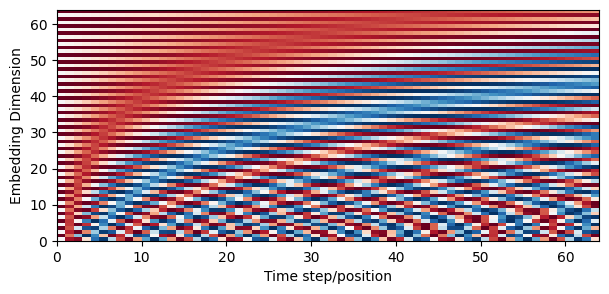

In [ ]:
seqlen = final_pixels**2
d = 64 # dummy
aaa = PositionalEncoding(d, max_wavelen=seqlen)

xx = torch.randn(1, seqlen, d)

plt.figure(figsize=(7, 3))
plt.pcolormesh(aaa.pe[0].T[:, :seqlen], vmin=-1, vmax=1, cmap="RdBu_r")
plt.xlabel("Time step/position")
plt.ylabel("Embedding Dimension")
plt.show()

Creating the actual model is then quite simple. If you want to scale: Increasing `d_model` and `n_layers` is all you really need. For very large `d_model` you could also increase `head_size` accordingly. But LLM scaling laws indicate that the exact numbers here matter relatively little, compared to the sheer scale of the model as a whole.

The numbers here will result in a rather small model. For good results, you will need to scale this up.

In [16]:
d_model = 256
head_size = 64
ar_model = ARTransformer(n_outputs=vqvae.quantizer.codebook_size, d_model=d_model, d_feedforward=4*d_model, n_heads=d_model // head_size, n_layers=4,
                         sequence_length=final_pixels**2)
ar_model.to(device)

ARTransformer(
  (embedding): Embedding(513, 256)
  (positional_encoding): PositionalEncoding(
    (dropout): Dropout(p=0.1, inplace=False)
  )
  (body): TransformerEncoder(
    (layers): ModuleList(
      (0-3): 4 x TransformerEncoderLayer(
        (self_attn): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=256, out_features=256, bias=True)
        )
        (linear1): Linear(in_features=256, out_features=1024, bias=True)
        (dropout): Dropout(p=0.1, inplace=False)
        (linear2): Linear(in_features=1024, out_features=256, bias=True)
        (norm1): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
        (norm2): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
        (dropout1): Dropout(p=0.1, inplace=False)
        (dropout2): Dropout(p=0.1, inplace=False)
      )
    )
  )
  (output_layer): Linear(in_features=256, out_features=512, bias=True)
)

In [17]:
num_params = count_parameters(ar_model)
print(f"Autoregressive model with {num_params:,d} trainable parameters")
num_params = count_parameters(decoder)
print(f"VQVAE decoder with {num_params:,d}  parameters")

Autoregressive model with 3,421,952 trainable parameters
VQVAE decoder with 7,707,831  parameters


In [18]:
model = LARP(ar_model, vqvae, (final_pixels, final_pixels)).to(device)
model.compile()

## Training

Note, we only add the autoregressive model parameters to the optimizer trainable variables. The VQVAE should stay fixed.

For large models, more epochs may be necessary/helpful. Also, the learning rate will often need to be decreased. This will usually be very obvious, with the model getting completely stuck at a large loss almost immediately. If you observe that happening, try again with a smaller learning rate.

In [20]:
n_epochs = 200

optimizer = torch.optim.AdamW(ar_model.parameters(), lr=0.001, weight_decay=0.1, amsgrad=False)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, n_epochs)

trainer = LARPTrainer(model=model, optimizer=optimizer, scheduler=scheduler, encode_on_the_fly=False,
                      training_loader=train_dataloader_encoded, validation_loader=test_dataloader_encoded,
                      n_epochs=n_epochs, device=device, plot_every_n_epochs=20, verbose=True)

In [ ]:
metrics = trainer.train_model()

In [22]:
trainer.evaluate()

(tensor(5.1264, device='cuda:0'),
 defaultdict(float,
             {'cross_entropy': tensor(5.1264, device='cuda:0'),
              'accuracy': tensor(0.0598, device='cuda:0'),
              'top_5_accuracy': tensor(0.1713, device='cuda:0')}))

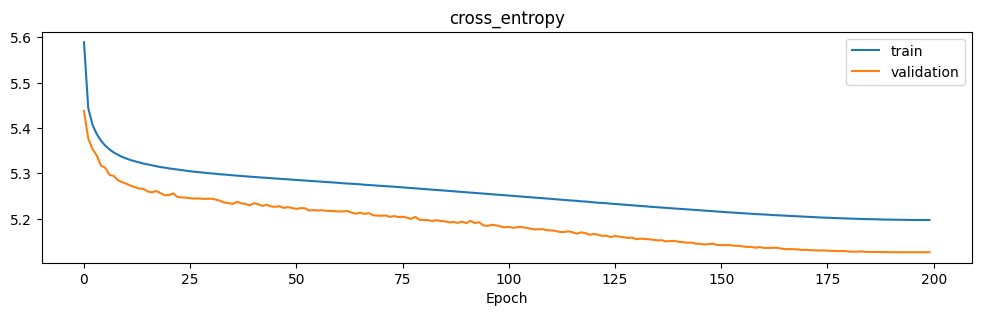

In [23]:
plot_learning_curves(metrics, ["cross_entropy"])

## Generation

We can check examples for various temperatures or top-k settings easily:

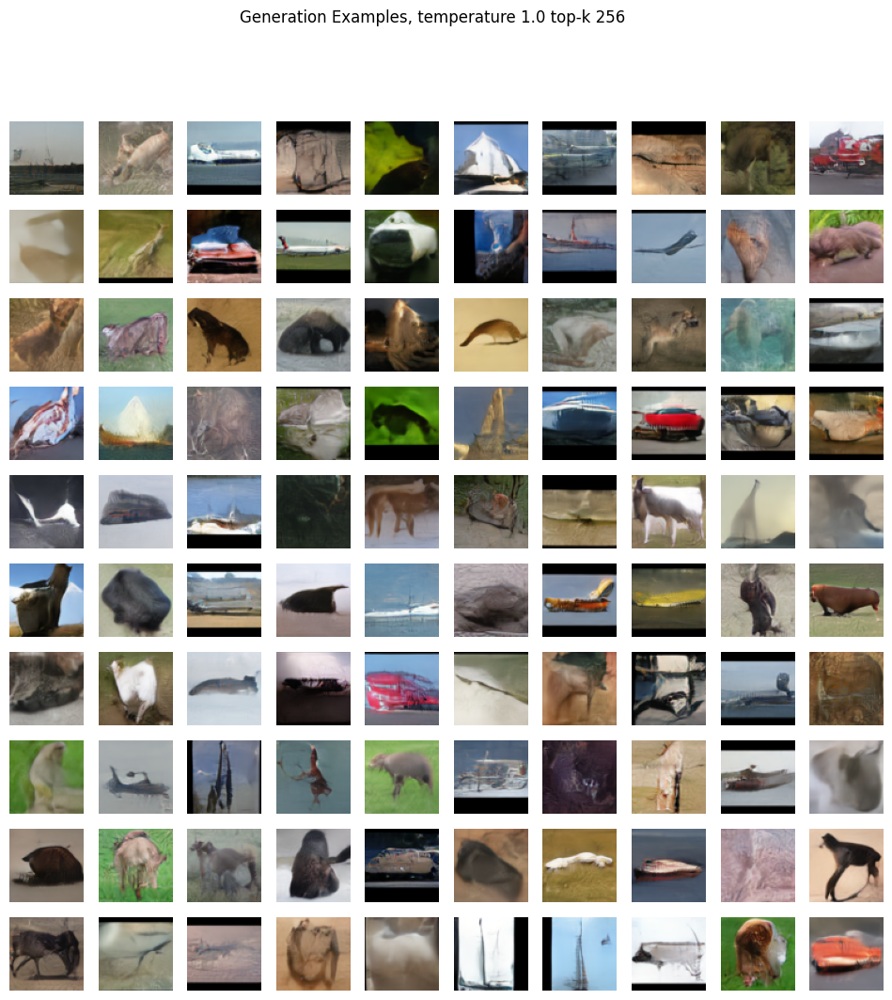

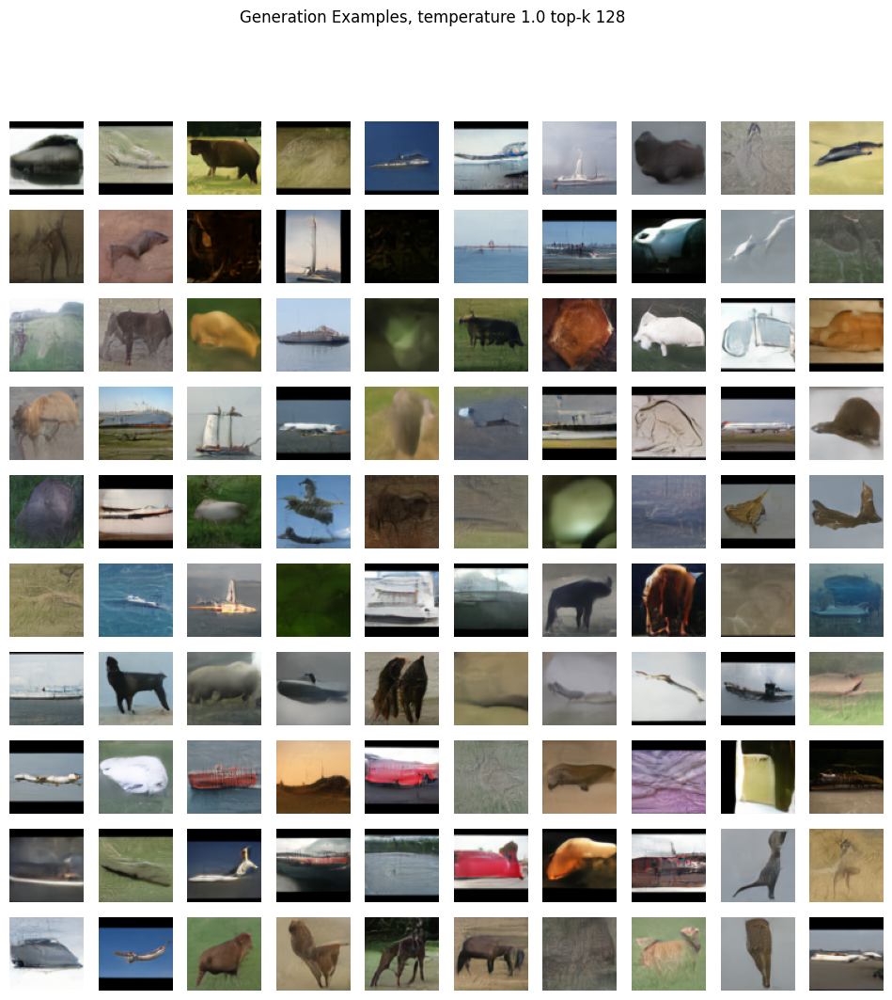

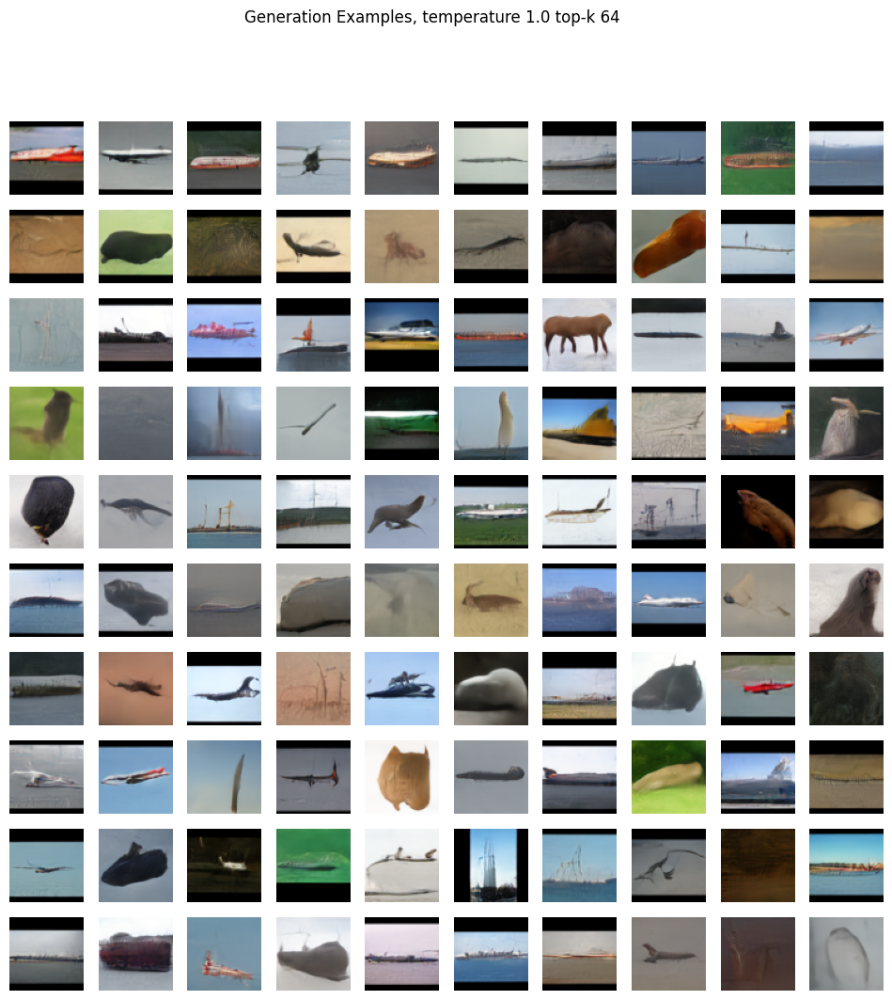

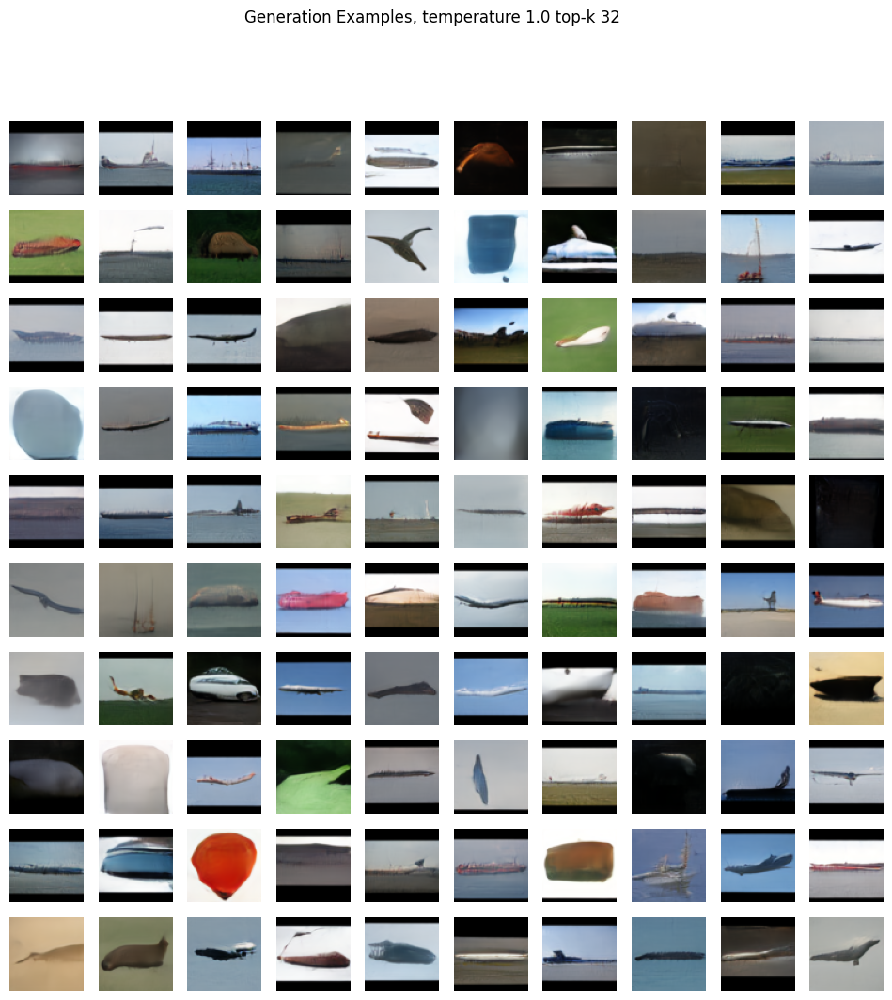

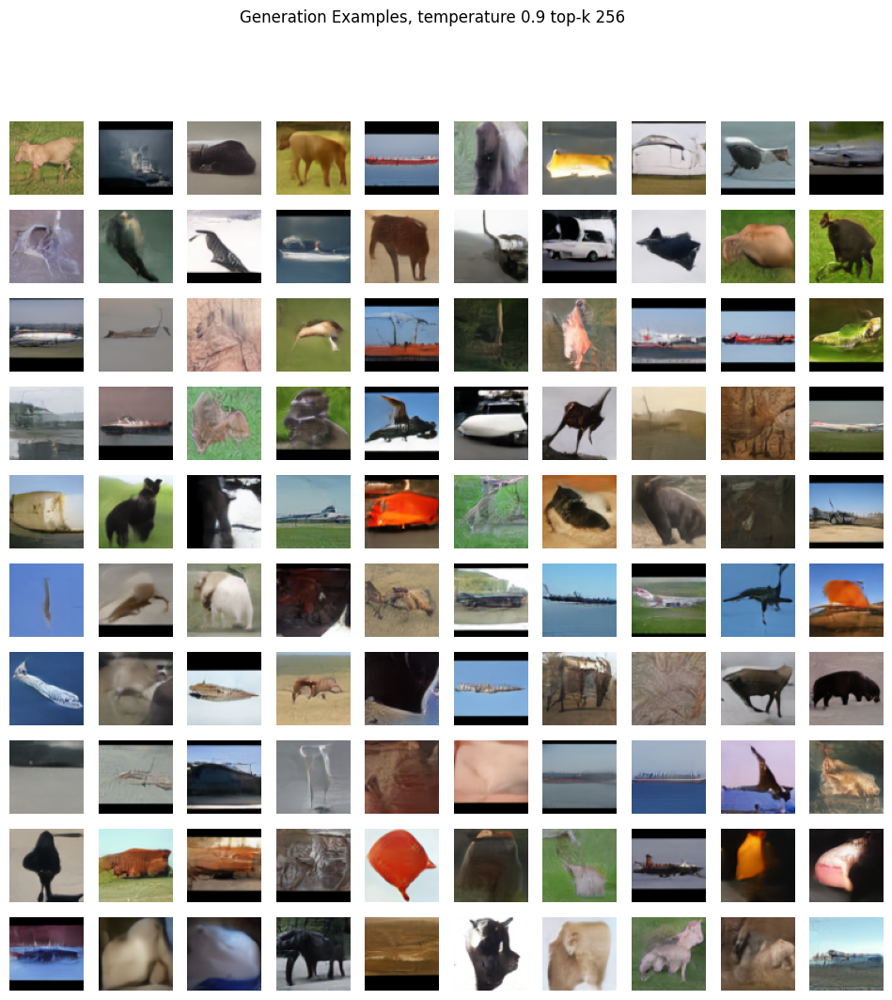

...

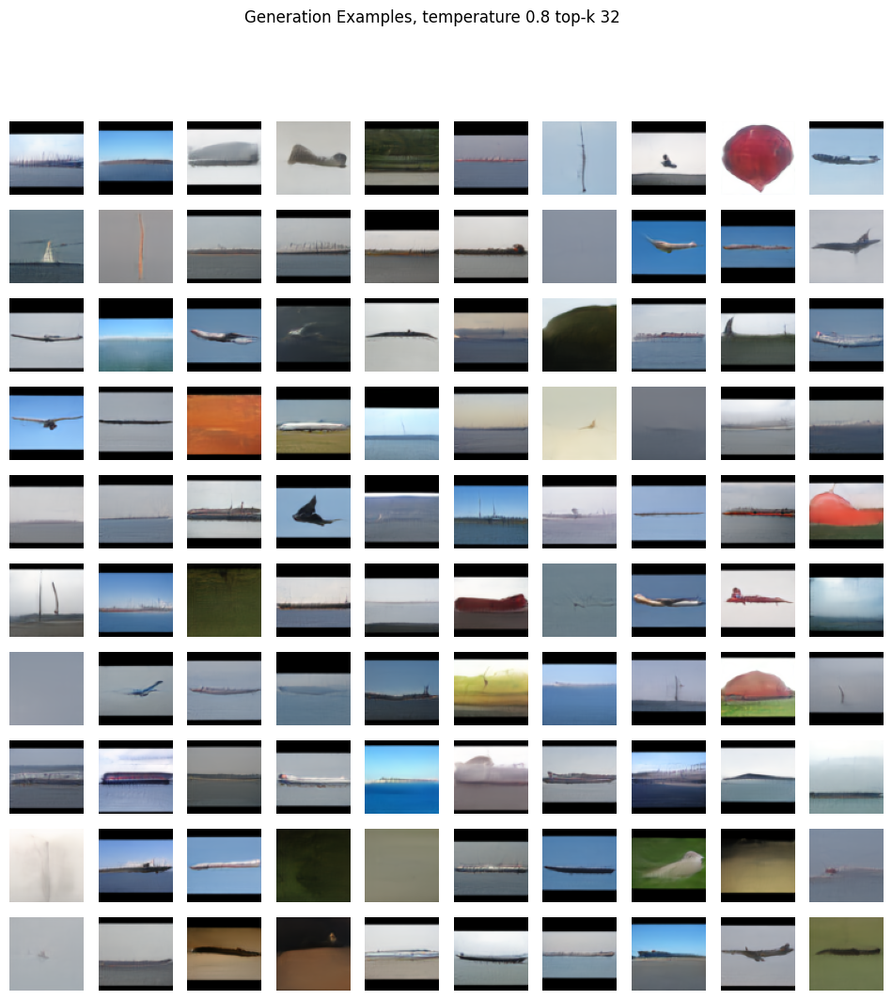

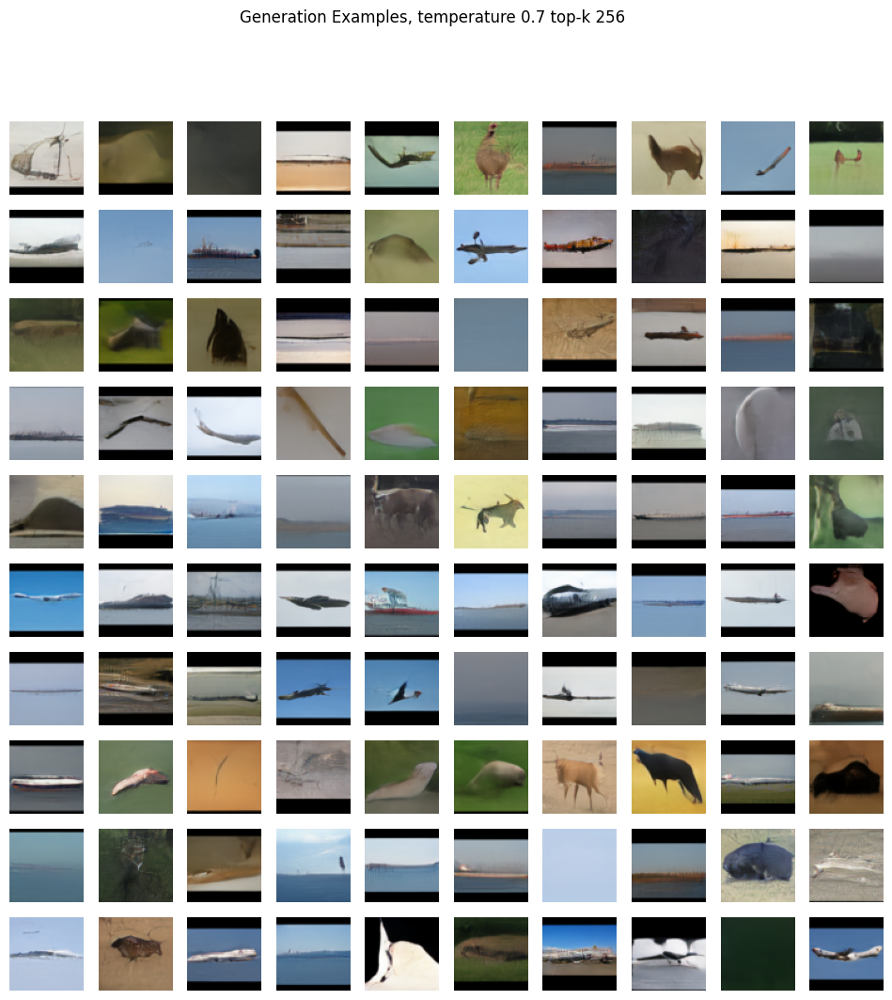

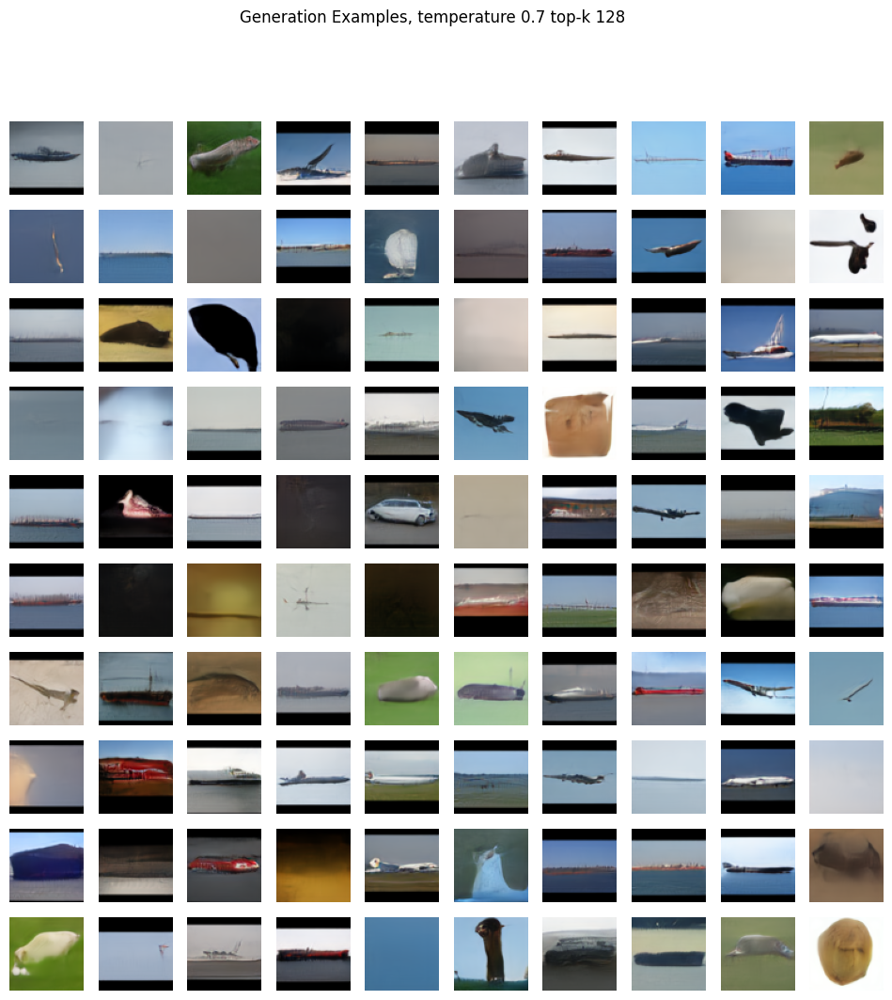

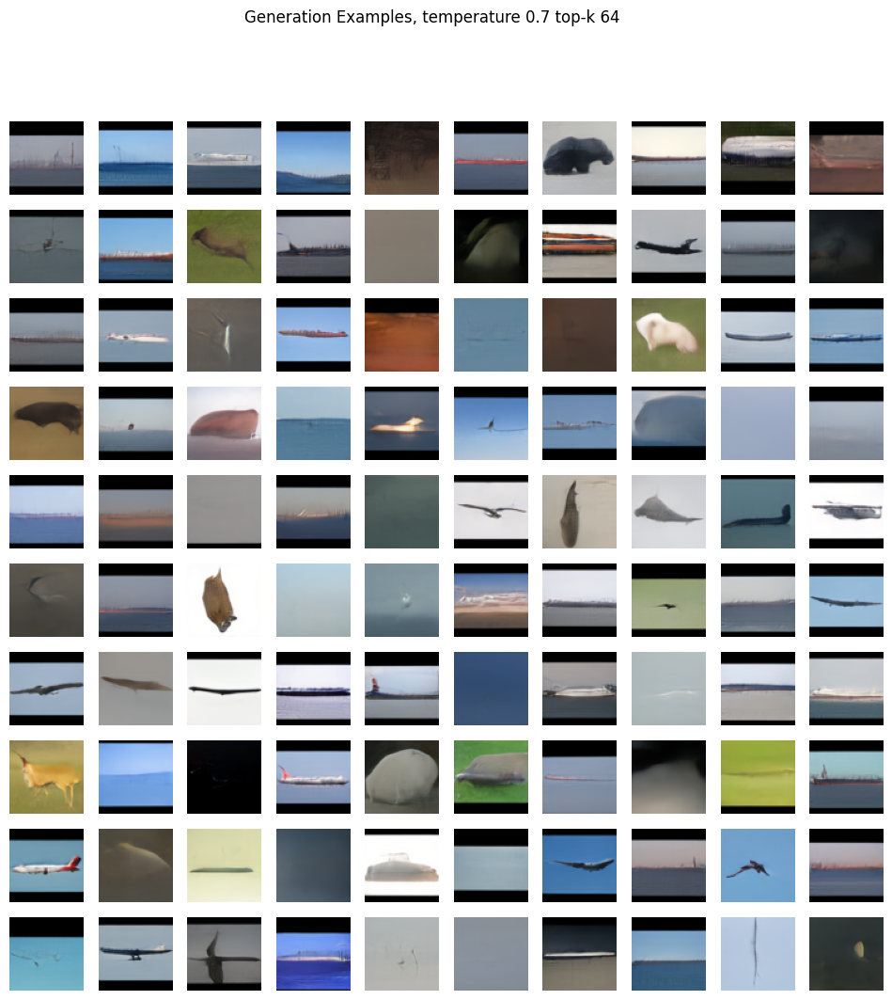

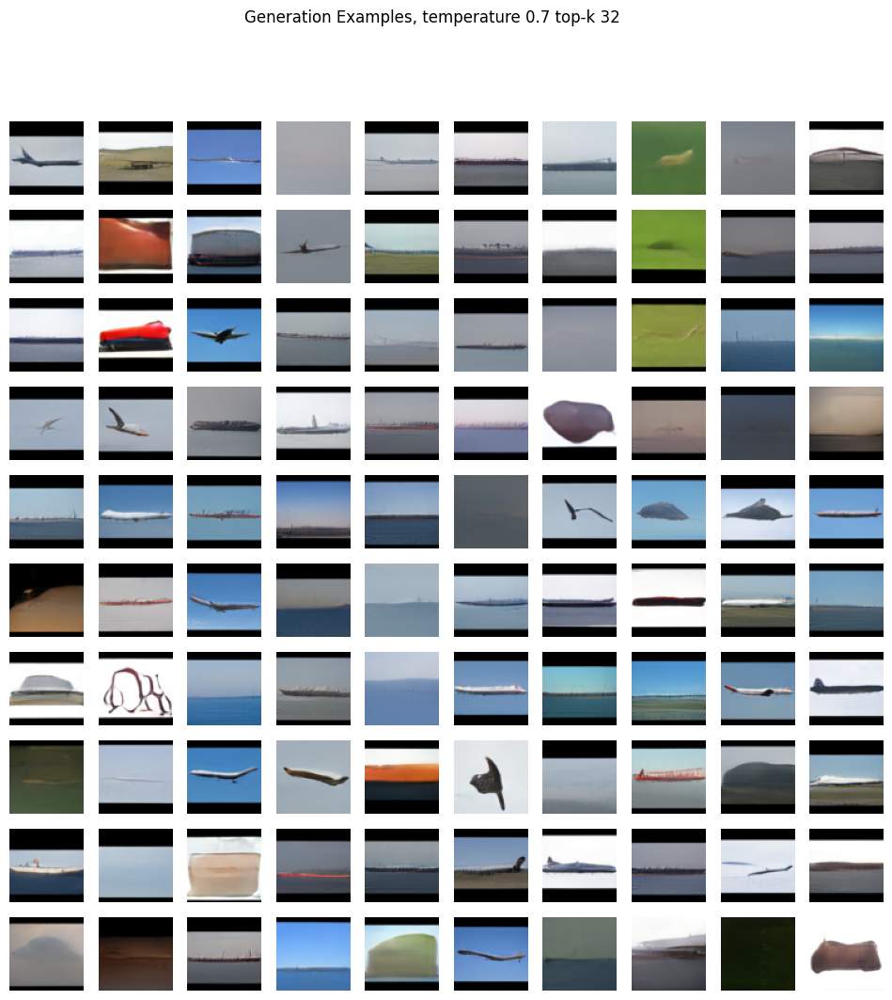

In [24]:
def generate_grid(nrows, temperature=1., top_k=None):
    with torch.inference_mode():
        generated = model.generate(nrows**2, temperature, top_k)
        generated = np.clip(generated.cpu().numpy(), 0, 1)

    plt.figure(figsize=(12, 12))
    for ind, img in enumerate(generated):
        plt.subplot(nrows, nrows, ind + 1)
        plt.imshow(img.transpose(1, 2, 0), vmin=0, vmax=1, cmap="Greys")
        plt.axis("off")
    plt.suptitle(f"Generation Examples, temperature {temperature} top-k {top_k}")
    plt.show()


temperatures = [1., 0.9, 0.8, 0.7]
top_ks = [256, 128, 64, 32]
for temp in temperatures:
    for top_k in top_ks:
        generate_grid(10, temp, top_k)

Or just default settings:

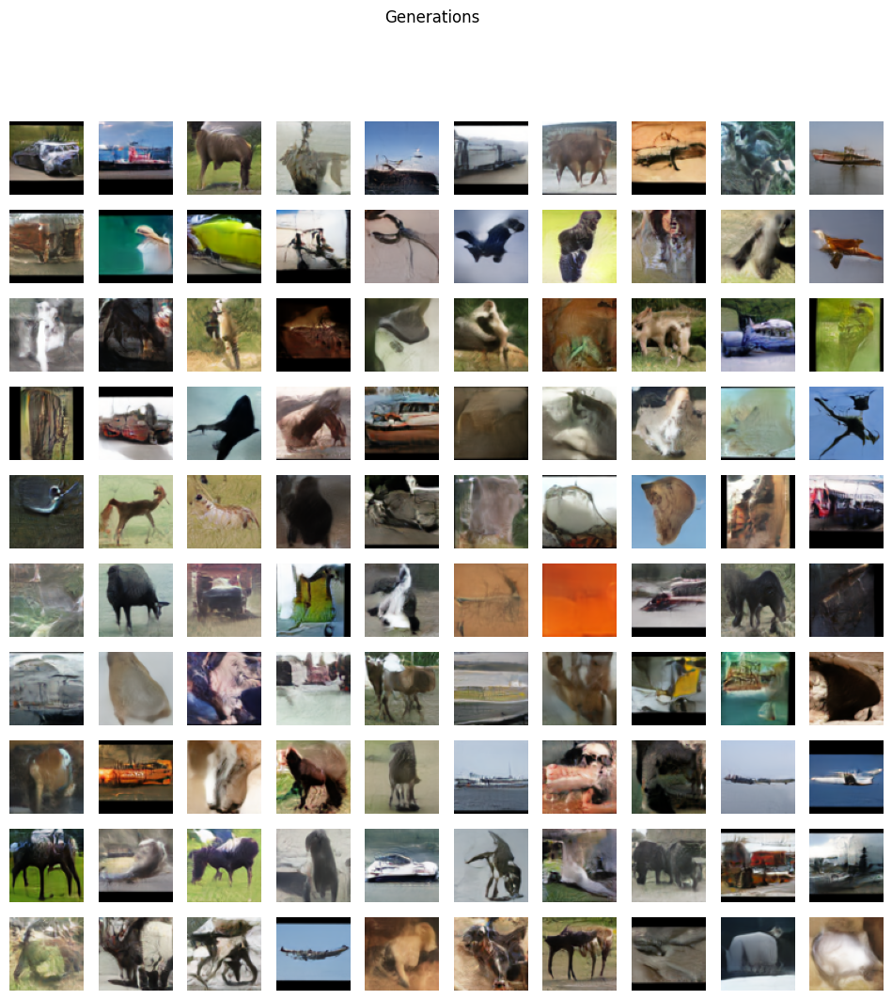

In [25]:
trainer.plot_examples()

## Evaluation

Usual stuff. For large datasets, you will want to use an ImageNet model for feature extraction. If you are using e.g. FashionMNIST or CIFAR, check back to previous notebooks to recall how to load the corresponding classifiers etc. For CIFAR, it should also be okay to use the ResNet, actually. However, this will make your results uncomparable to those obtained by our custom classifier.

We also showcase the precision-recall metric. Note that this depends on a hyperparameter `k`. The larger this is, the better the metric will be. It's important to choose one single `k` and consistently use this for all comparisons. Alternatively, you could compare the *curves* over `k`, but this is of course more difficult than comparing single numbers. The metric returns lists of length `k` for each value, where the `k`th entry corresponds to choosing that `k` for distance computations.

PS: Do not confuse this `k` with the one in top-k sampling. No relation!

In [26]:
feature_extractor = get_resnet().to(device)

In [27]:
def generate(n_samples, temperature=1, top_k=None):
    with torch.inference_mode():
        generated = model.generate(n_samples, temperature, top_k)
        return torch.clamp(generated, 0, 1)

In [28]:
fid_score, real_features, gen_features = fid(feature_extractor, test_dataloader, generate, use_tqdm=True, return_features=True)
print(f"FID: {fid_score:.4f}")

Computing real features:   0%|          | 0/63 [00:00<?, ?it/s]

Computing generated features:   0%|          | 0/63 [00:00<?, ?it/s]

FID: 63.0055


In [29]:
precision_recall(real_features, gen_features, batch_size, 5)

{'precisions': tensor([0.1276, 0.2142, 0.2610, 0.3044, 0.3519]),
 'recalls': tensor([0.1475, 0.2556, 0.3257, 0.3769, 0.4141]),
 'fscores': tensor([0.1368, 0.2331, 0.2898, 0.3368, 0.3805])}

We can also evaluate FIDs for different generation settings. Note, this is slower than necessary, as we re-compute the real data features each time. Would be great to have something like `fid_with_real_features`, where we use pre-computed features for the real data, but still generate new data. :')

In [31]:
model.eval()
fid_results = []
for temp in temperatures:
    print("TEMP", temp)
    fid_results.append([])
    for top_k in top_ks:
        def generate(nrows):
            with torch.inference_mode():
                generated = model.generate(nrows, temp, top_k)
                return torch.clamp(generated, 0, 1)
                
        print("K", top_k)
        fid_score = fid(feature_extractor, test_dataloader, generate, n_samples=50000, use_tqdm=False)
        print(f"FID: {fid_score:.4f}")
        print()
        fid_results[-1].append(fid_score)

TEMP 1.0
K 256
FID: 64.5713

K 128
FID: 77.6312

K 64
FID: 99.3422

K 32
FID: 125.1594

TEMP 0.9
K 256
FID: 69.4929

K 128
FID: 84.3374

K 64
FID: 107.5746

K 32
FID: 132.7431

TEMP 0.8
K 256
FID: 81.1916

K 128
FID: 97.2034

K 64
FID: 119.5164

K 32
FID: 143.0894

TEMP 0.7
K 256
FID: 102.2820

K 128
FID: 117.5008

K 64
FID: 138.3534

K 32
FID: 158.7830



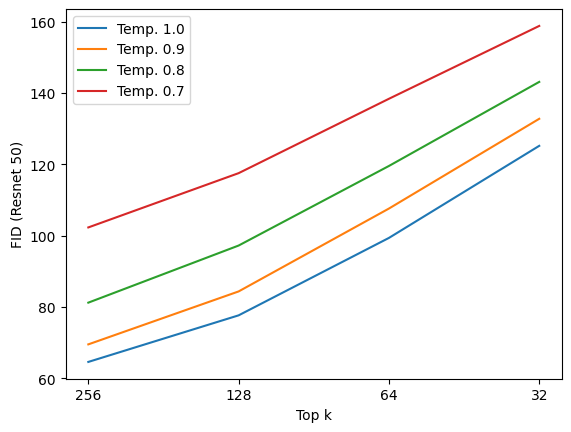

In [32]:
for temp, result_row in zip(temperatures, fid_results):
    plt.plot(result_row, label=f"Temp. {temp}")
plt.legend()
plt.ylabel("FID (Resnet 50)")
plt.xlabel("Top k")
plt.xticks(np.arange(len(top_ks)), np.array(top_ks))
plt.show()

## Saving the Model

We can save checkpoints as usual. **Please note**: Saving `model` will also save the VQVAE along with the autoregressive model. I have found behavior where later loading these weights back into `model` will result in worse generations for some reason. Evaluating the autoregressive model in isolation (via cross-entropy) showed the exact behavior from before saving. So the issue must lie somewhere with the VQVAE. Currently I am not sure what's going on, but the best bet seems to be to only save reload the autoregressive model parameters, and explicitly load the VQVAE parameters as outlined further above.

In [ ]:
torch.save(ar_model.state_dict(), f"weights/larp_{data}_8x8_cb{codebook_size}.pt")

In [ ]:
# to load weights later
#ar_model.load_state_dict(torch.load(f"weights/larp_{data}_8x8_cb{codebook_size}.pt"))